# **Model Predictions, Insights and Unique Label Distirbutions - Binary Classifiers**

In [ ]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# Declaring Variables

In [ ]:
# iteration number
iteration_number = 4

# bank names, topic dictionary, and cluster numbers
bank_names = ["barclays", "hsbc", "lloyds", "monzo", "n26", "natwest", "revolut", "santander", "starling", "wise"]
topic_dict = {-1:"noise", 0:"crypto", 1:"stocks", 2:"app interface", 3:"bank subscription plans", 
              4:"usage abroad", 5:"refunds", 6:"customer_service", 7:"account issues",
              8:"tedious paperwork (request of documents)", 
              9:"additional fees (e.g. card delivery and transaction fees)", 
              10:"business accounts", 11:"account verification", 12:"fraudulent transactions", 
              13:"online payments", 14:"frozen account and money holdout", 15:"exchange rates", 16:"transfers", 
              17:"atm withdrawal"}
cluster_numbers = [cluster_number for cluster_number in topic_dict.keys()]

# declaring plot colours
plot_colors = {'all': 'gray', 'monzo': 'tomato', 'starling': 'purple', 
               'wise': 'cyan', 'revolut': 'black', 
               'barclays': 'blue', 'hsbc': 'red', 
               'lloyds': 'green', 'n26': 'mediumturquoise', 
               'natwest': 'indigo', 'santander': 'firebrick'}

# declaring filepaths
word_embeddings_filepath = 'data/processed/word_embeddings/'
sentences_filepath = 'data/processed/tokenised_sentences/'
model_filepath = f'model/random_forest/ovr_models/iteration_{iteration_number}/'
results_filepath = f'model/random_forest/ovr_applied_entire_dataset_results/iteration_{iteration_number}/'

# Importing Libraries

In [ ]:
import pandas as pd
import numpy as np
# import scipy.sparse as sparse
import boto3
import tempfile
import joblib
from statistics import mean
from io import StringIO, BytesIO
import matplotlib.pyplot as plt
from collections import Counter
import plotly.graph_objects as go
import plotly.express as px

# Defining Functions to Save and Load Files

In [ ]:
# saving file
def saving_file(df, filepath, filename):
    
    bucket = 'intelligent-social-media-tracking' # already created on S3
    csv_buffer = StringIO()
    df.to_csv(csv_buffer)
    s3_resource = boto3.resource('s3')
    s3_resource.Object(bucket, filepath + filename).put(Body=csv_buffer.getvalue())

# loading file
def loading_file(filepath, filename, start_col):
    
    bucket = 'intelligent-social-media-tracking'
    data_key = filename
    data_location = 's3://{0}/{1}{2}'.format(bucket, filepath, data_key)
    df = pd.read_csv(data_location).iloc[:, start_col:]
    
    return df

# saving model
def saving_model(model, filepath, filename):
    
    bucket_name = 'intelligent-social-media-tracking'
    s3_client = boto3.client('s3')
    key = filepath + filename
    
    with tempfile.TemporaryFile() as fp:
        joblib.dump(model, fp)
        fp.seek(0)
        s3_client.put_object(Body=fp.read(), Bucket=bucket_name, Key=key)

# loading model
def loading_model(filepath, filename):
    
    bucket_name = 'intelligent-social-media-tracking'
    s3_client = boto3.client('s3')
    key = filepath + filename    
    
    with tempfile.TemporaryFile() as fp:
        s3_client.download_fileobj(Fileobj=fp, Bucket=bucket_name, Key=key)
        fp.seek(0)
        model = joblib.load(fp)
    return model

# Loading Word Embeddings and Sentences

In [ ]:
# merging all sentence embeddings
sentence_embeddings_large_df = pd.DataFrame()
for bank in bank_names:
    
    # loading sentences and sentence embeddings
    bank_sent_df = loading_file(sentences_filepath, f'{bank}_tokenized_sentences_df.csv', 1)
    sentence_embeddings_bank_large_df = loading_file(word_embeddings_filepath, f'sentence_embeddings_large_{bank}_df.csv', 1)
    
    # appending on sentences to sentence embeddings
    sentence_embeddings_bank_large_df = pd.concat([bank_sent_df, sentence_embeddings_bank_large_df], axis=1)
    
    # assigning company name
    sentence_embeddings_bank_large_df["company"] = bank
    
    print(f'Number of setences ({bank}): {len(sentence_embeddings_bank_large_df)}')
    
    # merging into single sentence embedding dataframe
    sentence_embeddings_large_df = pd.concat([sentence_embeddings_large_df, sentence_embeddings_bank_large_df])

print(f'Number of setences (merged): {len(sentence_embeddings_large_df)}')

Number of setences (barclays): 5646
Number of setences (hsbc): 31151
Number of setences (lloyds): 12664
Number of setences (monzo): 12307
Number of setences (n26): 13078
Number of setences (natwest): 18947
Number of setences (revolut): 57055
Number of setences (santander): 22175
Number of setences (starling): 20516
Number of setences (wise): 40160
Number of setences (merged): 233699


# Getting Predictions

In [ ]:
# declaring column names and word embeddings
x_col_name = [str(i) for i in range(512)]
x_features = sentence_embeddings_large_df.loc[:, x_col_name]

# iterating over each cluster number
for cluster_number in cluster_numbers:
    
    pred_list = []
    prob_list = []
    for iteration in range(1, 11): # iterating over each rf iteration
        
        # loading random forest, getting prediction and appending results onto list
        rf = loading_model(model_filepath, f'1000_n_estimators_25_max_features_100_max_depth_cluster_{cluster_number}_rf_{iteration}.sav')
        pred_cluster = rf.predict(x_features).astype(int)
        pred_list.append(pred_cluster)
        
        prob_list.append(rf.predict_proba(x_features)[:, 1])
    
    # majority voting
    pred_array = np.array(pred_list) # resulting array shape: 10 (number of model iterations) x number of sentences
    pred_array_transpose = np.transpose(pred_array) # resulting array shape: number of sentences x 10 (number of model iterations)
    majority_voting_pred = [Counter(pred_array_transpose[i]).most_common(1)[0][0] for i in range(len(sentence_embeddings_large_df))] # getting most commonly voted prediction
    sentence_embeddings_large_df[f'label_{cluster_number}'] = majority_voting_pred # assigning classification to column
    
    # averaging probabilities
    prob_array = np.array(prob_list) # resulting array shape: 10 (number of model iterations) x number of sentences
    prob_array_transpose = np.transpose(prob_array) # resulting array shape: number of sentences x 10 (number of model iterations)
    averaging_prob = [mean(prob_array_transpose[i]) for i in range(len(sentence_embeddings_large_df))] # averaging classification probability 
    sentence_embeddings_large_df[f'label_{cluster_number}_prob'] = averaging_prob # assigning probability to column
    
saving_file(sentence_embeddings_large_df, results_filepath, 'ovr_all_majority_voting_results.csv')

# Getting Date

In [ ]:
def get_text(bank):
    text_list = list(set(sentence_embeddings_large_df.loc[sentence_embeddings_large_df.loc[:, "company"] == bank, 'text']))
    return text_list

def get_dates(bank):
    
    # getting list of texts
    text_list = get_text(bank)
    
    # loading file with dates and text and getting a list of dates
    bank_df_poor = loading_file('data/processed/filtered_dataframes/', f'{bank}_df_poor.csv', 1)
    date_list = [bank_df_poor.loc[bank_df_poor.loc[:, "text"] == text_list[i], "date"].values[0][:10] for i in range(len(text_list))]
    
    return date_list

def get_all_text_and_dates():
    
    all_text_list = []
    all_dates_list = []
    
    bank_names = ["barclays", "hsbc", "lloyds", "monzo", "n26", "natwest", "revolut", "santander", "starling", "wise"]
    
    for bank in bank_names:
        text_list_bank = get_text(bank)
        date_list_bank = get_dates(bank)
        
        all_text_list.extend(text_list_bank)
        all_dates_list.extend(date_list_bank)
    
    return all_text_list, all_dates_list

# all text and dates
all_text_list, all_dates_list = get_all_text_and_dates()

# appending dates onto dataset
sentence_embeddings_large_df["date"] = 0
for i in range(len(all_text_list)):
    sentence_embeddings_large_df.loc[sentence_embeddings_large_df.loc[:, "text"] == all_text_list[i], "date"] = all_dates_list[i]

# saving dataset
saving_file(sentence_embeddings_large_df, results_filepath, 'ovr_all_majority_voting_results.csv')

# EDA on Predictions

## Distribution of Multitagged Sentences

In [ ]:
# loading results
sentence_embeddings_large_df = loading_file(results_filepath, 'ovr_all_majority_voting_results.csv', 1)

# getting number of tags for each sentence
sentence_embeddings_large_df["multi_class"] = 0
for cluster_number in cluster_numbers:
    sentence_embeddings_large_df["multi_class"] += sentence_embeddings_large_df[f"label_{cluster_number}"]

# defining function to get number of tagged labels for a given bank
def multitag_dist(bank):
    multiclass_df = sentence_embeddings_large_df.loc[sentence_embeddings_large_df.loc[:, "company"] == bank, "multi_class"]
    labels = [label for label in multiclass_df]
    
    return labels

# plotting interactive plot of histograms
fig = go.Figure()

# declaring plot colours
plot_colors = {'monzo': 'tomato', 'starling': 'purple', 
               'wise': 'cyan', 'revolut': 'black', 
               'barclays': 'blue', 'hsbc': 'red', 
               'lloyds': 'green', 'n26': 'mediumturquoise', 
               'natwest': 'indigo', 'santander': 'firebrick'}

# set up multiple traces
for bank in bank_names:
    fig.add_trace(go.Histogram(x=multitag_dist(bank),
                               name  = bank,
                               visible=True,
                               marker_color=plot_colors[bank]
                            )
                 )

# Add dropdown
fig.update_layout(
    updatemenus=[
        dict(
            type = "buttons",
            direction="right",
            buttons=list([ 
                dict(
                    args=[{'visible': True}], 
                    label="All", 
                    method="restyle"), 
                dict(
                    args=[{'histnorm':""}],
                    args2=[{'histnorm':"probability"}],
                    label="Normalised Frequency/Raw Frequency",
                    method="restyle")]),
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.99,
            xanchor="left",
            y=1.15,
            yanchor="top"
        ),
    ]
)

# add dropdown menus to the figure
fig.update_layout(title_text="Normalised Distribution of Multi-tagged Sentences", showlegend=True, autosize=False,
                  legend=dict(font=dict(size= 15)),
                  width=1200, height=600)
fig.update_xaxes(title_text='Number of Labels', tick0=0, dtick=1)
fig.update_yaxes(title_text='Normalised Frequency')

# adjust button type
for m in fig.layout.updatemenus:
    m['type'] = 'buttons'

f = fig.full_figure_for_development(warn=False)
    
fig.show()

## Distribution of Combination of Labels

In [ ]:
sentence_embeddings_large_df["multitag_combination"] = ""
for cluster_number in cluster_numbers:
    sentence_embeddings_large_df["multitag_combination"] += sentence_embeddings_large_df[f"label_{cluster_number}"].astype(str)

cluster_combi_tuples = []
for cluster_number in cluster_numbers:
    unique_combinations = len(list(set(sentence_embeddings_large_df.loc[sentence_embeddings_large_df.loc[:, f"label_{cluster_number}"] == 1, "multitag_combination"])))
    cluster_combi_tuples.append((cluster_number, unique_combinations))

cluster_combi_tuples_sorted = sorted(cluster_combi_tuples, key=lambda x: x[1])
cluster_numbers_sorted = [cluster_combi[0] for cluster_combi in cluster_combi_tuples_sorted]
cluster_topics_sorted = [topic_dict[cluster_num] for cluster_num in cluster_numbers_sorted]
cluster_combi_sorted = [cluster_combi[1] for cluster_combi in cluster_combi_tuples_sorted]

fig = go.Figure([go.Bar(
    x=cluster_combi_sorted, 
    y=cluster_topics_sorted,
    hovertemplate='<b>%{text}</b><extra></extra>',
    text=[f"cluster {cluster}" for cluster in cluster_numbers_sorted], 
    orientation='h')])

fig.update_layout(
    title={
        'text': "Distribution of Labels by Number of Unique Multi-Tag Combinations",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    xaxis_title="Frequency",
    yaxis = dict(tickfont = dict(size=10)),
    showlegend=False)


fig.show()

print(f"Total number of unique multi-tags = {len(list(set(sentence_embeddings_large_df['multitag_combination'])))}")

Total number of unique multi-tags = 2685


In [ ]:
cluster_numbers = cluster_numbers[1:]
capped_multitag = 2

# getting number of tags for each sentence
sentence_embeddings_large_df["multi_class"] = 0
for cluster_number in cluster_numbers:
    sentence_embeddings_large_df["multi_class"] += sentence_embeddings_large_df[f"label_{cluster_number}"]

# capping number of labels to 3
sentence_embeddings_large_df["capped_multi_class"] = sentence_embeddings_large_df["multi_class"].apply(lambda x: x if x <= capped_multitag else capped_multitag)

# unpacking string of label combinations into a list
sentence_embeddings_large_df["multi_tag_array"] = sentence_embeddings_large_df["multitag_combination"].apply(lambda x: [*x][1:])

# merging classification probability to a single string
sentence_embeddings_large_df["multitag_combination_prob"] = ""
counter = 0
for cluster_number in cluster_numbers:
    counter += 1
    if counter != len(cluster_numbers):
        sentence_embeddings_large_df["multitag_combination_prob"] += sentence_embeddings_large_df[f"label_{cluster_number}_prob"].astype(str) + ","
    else:
        sentence_embeddings_large_df["multitag_combination_prob"] += sentence_embeddings_large_df[f"label_{cluster_number}_prob"].astype(str)

# converting string of probabilities to list of probabilities
sentence_embeddings_large_df["multi_tag_prob_array"] = sentence_embeddings_large_df["multitag_combination_prob"].apply(lambda x: list(map(float, x.split(","))))

# merging list of labels and probabilities into a single list
sentence_embeddings_large_df['multi_tag_label_prob'] = list(zip(sentence_embeddings_large_df.multi_tag_array, sentence_embeddings_large_df.multi_tag_prob_array))

# unpacking both lists to form a list of tuples consisting of the tag (0 or 1), probability and label
sentence_embeddings_large_df["tag_prob_label"] = sentence_embeddings_large_df["multi_tag_label_prob"].apply(lambda x: [(x[0][i], x[1][i], i) for i in range(len(x[0]))])

# sorting tuples by the probability in descending order
sentence_embeddings_large_df["tag_prob_label_sorted"] = sentence_embeddings_large_df["tag_prob_label"].apply(lambda x: sorted(x, key=lambda y: y[1], reverse=True))

# merging list of tuples with number of labels/classes 
sentence_embeddings_large_df["tag_prob_label_sorted_multi_class"] = list(zip(sentence_embeddings_large_df.tag_prob_label_sorted, sentence_embeddings_large_df.capped_multi_class))

# getting the multiple labels the sentences are tagged as 
sentence_embeddings_large_df["top_tag_prob_labels"] = sentence_embeddings_large_df["tag_prob_label_sorted_multi_class"].apply(lambda x: x[0][: x[1]])

# topics of each label, stored as an array
sentence_embeddings_large_df["top_topics_list"] = sentence_embeddings_large_df["top_tag_prob_labels"].apply(lambda x: sorted([topic_dict[tag_prob_label[2]] for tag_prob_label in x]))

# topics of each label as string
sentence_embeddings_large_df["top_topics_str"] = sentence_embeddings_large_df["top_topics_list"].apply(lambda x: ", ".join(x))

num_top_plot = 20
num_multitags = [i for i in range(1, capped_multitag+1)]
for num in num_multitags:
    
    num_multitag_df = sentence_embeddings_large_df.loc[sentence_embeddings_large_df.loc[:, 'capped_multi_class'] == num, :]
    multitag_combinations = list(set(num_multitag_df.loc[:, 'top_topics_str']))
    combi_count_tuples = [(combi, len(num_multitag_df.loc[num_multitag_df.loc[:, "top_topics_str"] == combi, :])) for combi in multitag_combinations]
    combi_count_tuples_sorted = sorted(combi_count_tuples, key=lambda x: x[1], reverse=True)[:num_top_plot + 1]
    combi_count_tuples_sorted = sorted(combi_count_tuples_sorted, key=lambda x: x[1])
    combi_counts = [combi_tuple[1] for combi_tuple in combi_count_tuples_sorted]
    combi_topics = [combi_tuple[0] for combi_tuple in combi_count_tuples_sorted]
    
    combi_norm_count_tuples = [(combi, len(num_multitag_df.loc[num_multitag_df.loc[:, "top_topics_str"] == combi, :])/len(num_multitag_df)) for combi in multitag_combinations]
    combi_norm_count_tuples_sorted = sorted(combi_norm_count_tuples, key=lambda x: x[1], reverse=True)[:num_top_plot + 1]
    combi_norm_count_tuples_sorted = sorted(combi_norm_count_tuples_sorted, key=lambda x: x[1])
    combi_norm_counts = [combi_tuple[1] for combi_tuple in combi_norm_count_tuples_sorted]
    combi_norm_topics = [combi_tuple[0] for combi_tuple in combi_norm_count_tuples_sorted]
    
    # setting up figure and lists to store buttons
    fig = go.Figure()
    buttons_1 = []
    y_buttons_1 = -0.15
    
    # plotting distribution of clusters
    fig.add_trace(go.Bar(
        x=combi_counts, 
        y=combi_topics,
        visible=True,
        orientation='h'))
    
    # button formatting
    button =  dict(
        args = [{'visible':[True, False]}, 
                {"title": f"Distribution of Unique Label Combinations with {num} labels (Excluding Noise)", "xaxis_title": "Frequency"}], 
        label = "Raw Frequency",
        method = 'update'
    )            
    buttons_1.append(button)
    
    # plotting normalised distribution of clusters
    fig.add_trace(go.Bar(
        x=combi_norm_counts, 
        y=combi_norm_topics,
        visible=False,
        orientation='h'))
    
    # button formatting
    button =  dict(
        args = [{'visible':[False, True]}, 
                {"title": f"Normalised Distribution of Unique Label Combinations with {num} labels (Excluding Noise)", "xaxis_title": "Normalised Frequency"}], 
        label = "Normalised Frequency",
        method = 'update'
    )
    buttons_1.append(button)

                 
    # Add dropdown
    fig.update_layout(
        updatemenus=[
            dict(
                type = "buttons",
                direction="right",
                buttons=buttons_1,
                pad={"r": 10, "t": 10},
                showactive=True,
                x=0,
                xanchor="left",
                y=y_buttons_1,
                yanchor="top"
            )
        ]
    )

    fig.update_layout(width=1200, height=600,
        title={
            'text': f"Distribution of Unique Label Combinations with {num} labels (Excluding Noise)",
            'y':0.9,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'},
        xaxis_title="Frequency",
        yaxis = dict(tickfont = dict(size=10)),
        xaxis = dict(tickfont = dict(size=10)),
        showlegend=False)

    fig.show()
    
    print(f"Total number of unique label combinations with {num} labels: {len(multitag_combinations)}")

# saving_file(sentence_embeddings_large_df, results_filepath, 'ovr_all_majority_voting_multitagging.csv')

Total number of unique label combinations with 1 labels: 18


Total number of unique label combinations with 2 labels: 153


In [ ]:
cluster_numbers = [cluster_number for cluster_number in topic_dict.keys()]
capped_multitag = 2

# getting number of tags for each sentence
sentence_embeddings_large_df["multi_class"] = 0
for cluster_number in cluster_numbers:
    sentence_embeddings_large_df["multi_class"] += sentence_embeddings_large_df[f"label_{cluster_number}"]

# capping number of labels to 3
sentence_embeddings_large_df["capped_multi_class"] = sentence_embeddings_large_df["multi_class"].apply(lambda x: x if x <= capped_multitag else capped_multitag)

# unpacking string of label combinations into a list
sentence_embeddings_large_df["multi_tag_array"] = sentence_embeddings_large_df["multitag_combination"].apply(lambda x: [*x])

# merging classification probability to a single string
sentence_embeddings_large_df["multitag_combination_prob"] = ""
counter = 0
for cluster_number in cluster_numbers:
    counter += 1
    if counter != len(cluster_numbers):
        sentence_embeddings_large_df["multitag_combination_prob"] += sentence_embeddings_large_df[f"label_{cluster_number}_prob"].astype(str) + ","
    else:
        sentence_embeddings_large_df["multitag_combination_prob"] += sentence_embeddings_large_df[f"label_{cluster_number}_prob"].astype(str)

# converting string of probabilities to list of probabilities
sentence_embeddings_large_df["multi_tag_prob_array"] = sentence_embeddings_large_df["multitag_combination_prob"].apply(lambda x: list(map(float, x.split(","))))

# merging list of labels and probabilities into a single list
sentence_embeddings_large_df['multi_tag_label_prob'] = list(zip(sentence_embeddings_large_df.multi_tag_array, sentence_embeddings_large_df.multi_tag_prob_array))

# unpacking both lists to form a list of tuples consisting of the tag (0 or 1), probability and label
sentence_embeddings_large_df["tag_prob_label"] = sentence_embeddings_large_df["multi_tag_label_prob"].apply(lambda x: [(x[0][i], x[1][i], i-1) for i in range(len(x[0]))])

# sorting tuples by the probability in descending order
sentence_embeddings_large_df["tag_prob_label_sorted"] = sentence_embeddings_large_df["tag_prob_label"].apply(lambda x: sorted(x, key=lambda y: y[1], reverse=True))

# merging list of tuples with number of labels/classes 
sentence_embeddings_large_df["tag_prob_label_sorted_multi_class"] = list(zip(sentence_embeddings_large_df.tag_prob_label_sorted, sentence_embeddings_large_df.capped_multi_class))

# getting the multiple labels the sentences are tagged as 
sentence_embeddings_large_df["top_tag_prob_labels"] = sentence_embeddings_large_df["tag_prob_label_sorted_multi_class"].apply(lambda x: x[0][: x[1]])

# topics of each label, stored as an array
sentence_embeddings_large_df["top_topics_list"] = sentence_embeddings_large_df["top_tag_prob_labels"].apply(lambda x: sorted([topic_dict[tag_prob_label[2]] for tag_prob_label in x]))

# topics of each label as string
sentence_embeddings_large_df["top_topics_str"] = sentence_embeddings_large_df["top_topics_list"].apply(lambda x: ", ".join(x))

num_top_plot = 20
num_multitags = [i for i in range(1, capped_multitag+1)]
for num in num_multitags:
    
    num_multitag_df = sentence_embeddings_large_df.loc[sentence_embeddings_large_df.loc[:, 'capped_multi_class'] == num, :]
    multitag_combinations = list(set(num_multitag_df.loc[:, 'top_topics_str']))
    combi_count_tuples = [(combi, len(num_multitag_df.loc[num_multitag_df.loc[:, "top_topics_str"] == combi, :])) for combi in multitag_combinations]
    combi_count_tuples_sorted = sorted(combi_count_tuples, key=lambda x: x[1], reverse=True)[:num_top_plot + 1]
    combi_count_tuples_sorted = sorted(combi_count_tuples_sorted, key=lambda x: x[1])
    combi_counts = [combi_tuple[1] for combi_tuple in combi_count_tuples_sorted]
    combi_topics = [combi_tuple[0] for combi_tuple in combi_count_tuples_sorted]
    
    combi_norm_count_tuples = [(combi, len(num_multitag_df.loc[num_multitag_df.loc[:, "top_topics_str"] == combi, :])/len(num_multitag_df)) for combi in multitag_combinations]
    combi_norm_count_tuples_sorted = sorted(combi_norm_count_tuples, key=lambda x: x[1], reverse=True)[:num_top_plot + 1]
    combi_norm_count_tuples_sorted = sorted(combi_norm_count_tuples_sorted, key=lambda x: x[1])
    combi_norm_counts = [combi_tuple[1] for combi_tuple in combi_norm_count_tuples_sorted]
    combi_norm_topics = [combi_tuple[0] for combi_tuple in combi_norm_count_tuples_sorted]
    
    # setting up figure and lists to store buttons
    fig = go.Figure()
    buttons_1 = []
    y_buttons_1 = -0.15
    
    # plotting distribution of clusters
    fig.add_trace(go.Bar(
        x=combi_counts, 
        y=combi_topics,
        visible=True,
        orientation='h'))
    
    # button formatting
    button =  dict(
        args = [{'visible':[True, False]}, 
                {"title": f"Distribution of Unique Label Combinations with {num} labels (Including Noise)", "xaxis_title": "Frequency"}], 
        label = "Raw Frequency",
        method = 'update'
    )            
    buttons_1.append(button)
    
    # plotting normalised distribution of clusters
    fig.add_trace(go.Bar(
        x=combi_norm_counts, 
        y=combi_norm_topics,
        visible=False,
        orientation='h'))
    
    # button formatting
    button =  dict(
        args = [{'visible':[False, True]}, 
                {"title": f"Normalised Distribution of Unique Label Combinations with {num} labels (Including Noise)", "xaxis_title": "Normalised Frequency"}], 
        label = "Normalised Frequency",
        method = 'update'
    )
    buttons_1.append(button)

                 
    # Add dropdown
    fig.update_layout(
        updatemenus=[
            dict(
                type = "buttons",
                direction="right",
                buttons=buttons_1,
                pad={"r": 10, "t": 10},
                showactive=True,
                x=0,
                xanchor="left",
                y=y_buttons_1,
                yanchor="top"
            )
        ]
    )

    fig.update_layout(width=1200, height=800,
        title={
            'text': f"Distribution of Unique Label Combinations with {num} labels",
            'y':0.9,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'},
        xaxis_title="Frequency",
        yaxis = dict(tickfont = dict(size=15)),
        xaxis = dict(tickfont = dict(size=15)),
        showlegend=False)

    fig.show()
    
    print(f"Total number of unique label combinations with {num} labels: {len(multitag_combinations)}")

# saving_file(sentence_embeddings_large_df, results_filepath, 'ovr_all_majority_voting_multitagging_noise.csv')

Total number of unique label combinations with 1 labels: 19


Total number of unique label combinations with 2 labels: 170


In [ ]:
# cluster_numbers = cluster_numbers[1:]

# get the distribution of multilabels for a given label
def combination_labels(cluster_number):
    
    # getting the sentences tagged as the given cluster
    label_cluster_number_df = sentence_embeddings_large_df.loc[sentence_embeddings_large_df.loc[:, f"label_{cluster_number}"] == 1, :]
    cluster_size = len(label_cluster_number_df)
    
    # counting frequency of multitags by cluster
    cluster_num_tuple = []
    for cluster_num in topic_dict.keys():
        if cluster_num != -1 and cluster_num != cluster_number:
            cluster_num_count = sum(label_cluster_number_df.loc[label_cluster_number_df.loc[:, f"label_{cluster_num}"] == 1, f"label_{cluster_num}"])/cluster_size
            cluster_num_tuple.append((cluster_num, cluster_num_count))
    
    # sorting by counts
    cluster_num_tuple_sorted = sorted(cluster_num_tuple, key=lambda x: x[1])
    cluster_numbers_sorted = [cluster_tuple[0] for cluster_tuple in cluster_num_tuple_sorted]
    cluster_size_sorted = [cluster_tuple[1] for cluster_tuple in cluster_num_tuple_sorted]
    cluster_topics_sorted = [topic_dict[cluster_num] for cluster_num in cluster_numbers_sorted]
    
    return cluster_numbers_sorted, cluster_size_sorted, cluster_topics_sorted

# setting up figure and lists to store buttons
fig = go.Figure()
buttons_1 = []
y_buttons_1 = -0.15

counter = 0 # counter to set visible plot

# iterating over each cluster number and each bank, plotting line trace and formatting the button
for cluster_number in cluster_numbers:
    
    cluster_numbers_sorted, cluster_size_sorted, cluster_topics_sorted = combination_labels(cluster_number)
    
    counter += 1
    
    # plotting distribution of clusters
    fig.add_trace(go.Bar(
        x=cluster_size_sorted, 
        y=cluster_topics_sorted,
        visible=True if counter == 1 else False,
        hovertemplate='<b>%{text}</b><extra></extra>',
        text=[f"cluster {cluster}" for cluster in cluster_numbers_sorted], 
        orientation='h'))
    
    # button formatting
    button =  dict(
        args = [{'visible':[True if cluster_no == cluster_number else False for cluster_no in cluster_numbers]}, 
                {"title": f"Distribution of Other Labels (Multitagging) for Label {cluster_number} - {topic_dict[cluster_number].title()}"}], 
        label = cluster_number,
        method = 'update'
    )

    buttons_1.append(button)

# Add dropdown
fig.update_layout(
    updatemenus=[
        dict(
            type = "buttons",
            direction="right",
            buttons=buttons_1,
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0,
            xanchor="left",
            y=y_buttons_1,
            yanchor="top"
        )
    ]
)

fig.update_layout(
    title={
        'text': f"Distribution of Other Labels (Multitagging) for Label 0 - {topic_dict[0]}",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    xaxis_title="Normalised Frequency",
    yaxis = dict(tickfont = dict(size=10)),
    xaxis = dict(tickfont = dict(size=10),
                 tickmode = 'linear',
                 tick0 = 0,
                 dtick = 0.1),
    showlegend=False)

fig.show()

## Normalised Distribution of Labels for Each Bank

In [ ]:
# defining a function to get the size for each label for a given bank
def label_size(bank):
    
    norm_cluster_pred = []
    cluster_pred = []
    if bank != "all":
        # getting normalised cluster size for each class for all banks
        for cluster_number in cluster_numbers:
            count_cluster_number = sum(sentence_embeddings_large_df.loc[sentence_embeddings_large_df.loc[:, "company"] == bank, f"label_{cluster_number}"])
            norm_count_cluster_number = len(sentence_embeddings_large_df.loc[sentence_embeddings_large_df.loc[:, "company"] == bank])
            norm_cluster_pred.append((cluster_number, count_cluster_number/norm_count_cluster_number))
            cluster_pred.append((cluster_number, count_cluster_number))
    else:
        # getting normalised cluster size for each class over entire dataset
        for cluster_number in cluster_numbers:
            count_cluster_number = sum(sentence_embeddings_large_df.loc[:, f"label_{cluster_number}"])
            norm_count_cluster_number = len(sentence_embeddings_large_df)
            norm_cluster_pred.append((cluster_number, count_cluster_number/norm_count_cluster_number))
            cluster_pred.append((cluster_number, count_cluster_number))
    
    # sorting by size of label
    norm_cluster_pred_sorted = sorted(norm_cluster_pred, key=lambda x: x[1])
    cluster_pred_sorted = sorted(cluster_pred, key=lambda x: x[1])
    
    # sorting normalised frequencies
    norm_cluster_numbers_sorted = [cluster_tuple[0] for cluster_tuple in norm_cluster_pred_sorted]
    norm_cluster_size_sorted = [cluster_tuple[1] for cluster_tuple in norm_cluster_pred_sorted]
    
    # sorting raw frequencies
    cluster_numbers_sorted = [cluster_tuple[0] for cluster_tuple in cluster_pred_sorted]
    cluster_size_sorted = [cluster_tuple[1] for cluster_tuple in cluster_pred_sorted]
    
    # associated topics
    cluster_topics = [topic_dict[cluster_number] for cluster_number in norm_cluster_numbers_sorted]
    
    return norm_cluster_numbers_sorted, norm_cluster_size_sorted, cluster_numbers_sorted, cluster_size_sorted, cluster_topics


# setting up figure and lists to store buttons
fig = go.Figure()
buttons_1 = []
y_buttons_1 = -0.15
all_bank_names = ["all", "barclays", "hsbc", "lloyds", "monzo", "n26", "natwest", "revolut", "santander", "starling", "wise"]
counter = 0 # counter to set visible plot

for bank in all_bank_names:
    
    counter += 1
    
    norm_cluster_numbers_sorted, norm_cluster_size_sorted, cluster_numbers_sorted, cluster_size_sorted, cluster_topics = label_size(bank)
    
    # plotting distribution of clusters
    fig.add_trace(go.Bar(
        x=norm_cluster_size_sorted, 
        y=cluster_topics, 
        visible=True if counter == 1 else False,
        hovertemplate='<b>%{text}</b><extra></extra>',
        text=[f"cluster {cluster}" for cluster in cluster_numbers_sorted], 
        orientation='h'))
    
    # button formatting
    button =  dict(
        args = [{'visible':[True if bank_name == bank else False for bank_name in all_bank_names]}, 
                {"title": f"Normalised Distribution of Labels - {bank.title()}"}], 
        label = bank.title(),
        method = 'update'
    )

    buttons_1.append(button)
    
# Add dropdown
fig.update_layout(
    updatemenus=[
        dict(
            type = "buttons",
            direction="right",
            buttons=buttons_1,
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0,
            xanchor="left",
            y=y_buttons_1,
            yanchor="top"
        )
    ]
)

fig.update_layout(
    title={
        'text': f"Normalised Distribution of Labels - {all_bank_names[0].title()}",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    xaxis_title="Normalised Frequency",
    yaxis = dict(tickfont = dict(size=10)),
    xaxis = dict(tickfont = dict(size=10),
                 tickmode = 'linear',
                 tick0 = 0,
                 dtick = 0.1),
    showlegend=False)

fig.show()

## Distribution of Labels Across Banks

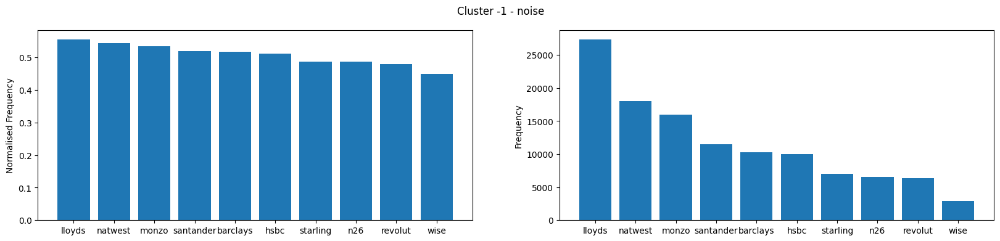

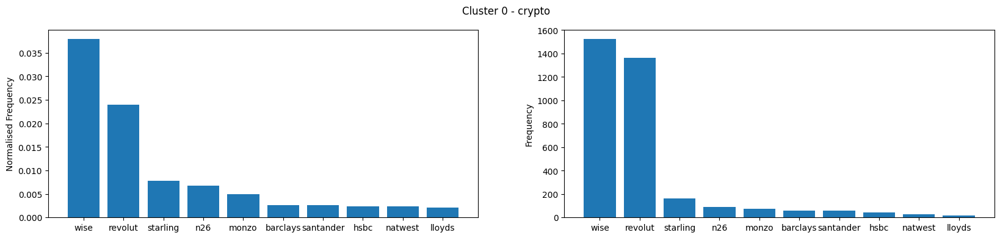

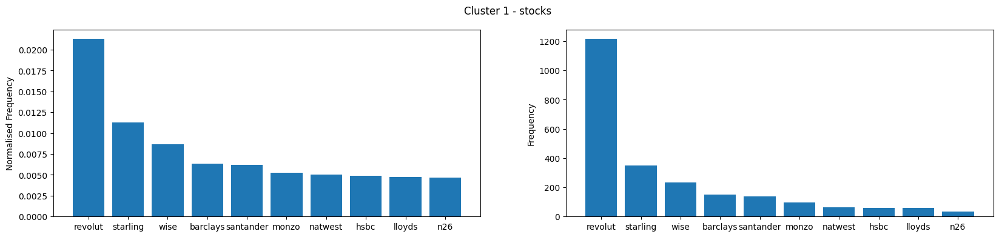

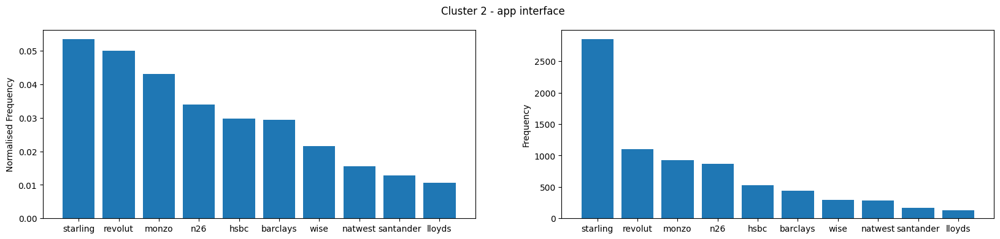

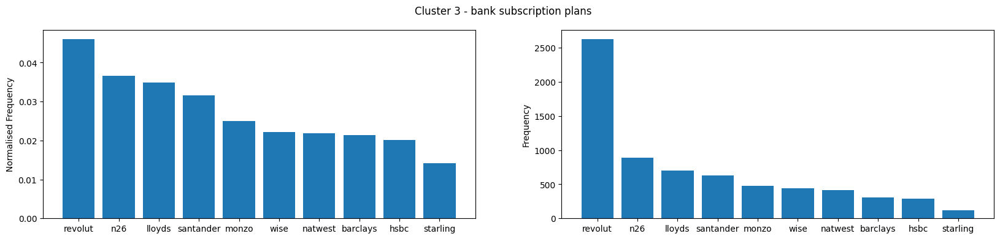

...

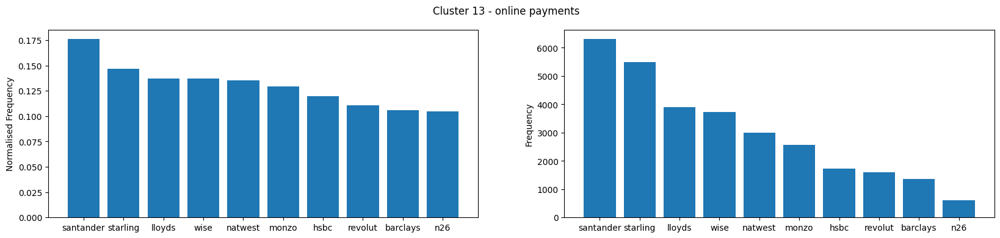

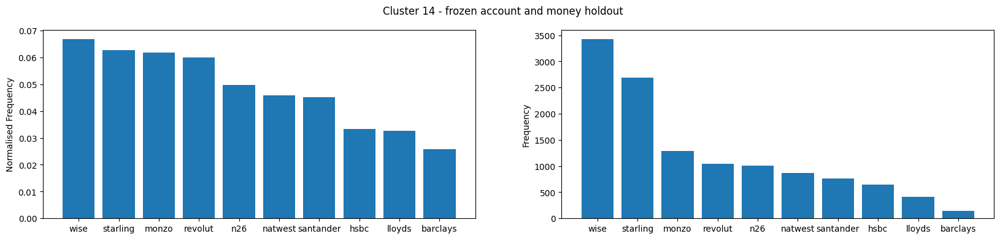

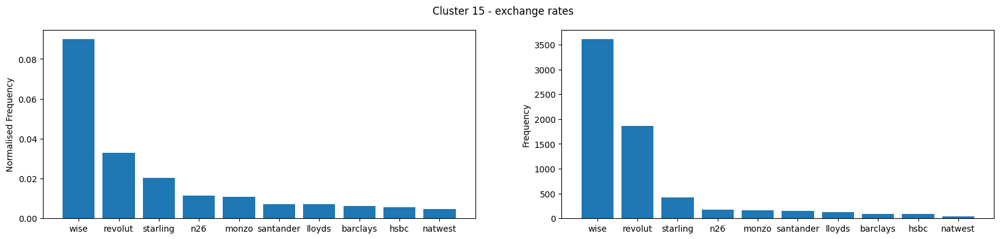

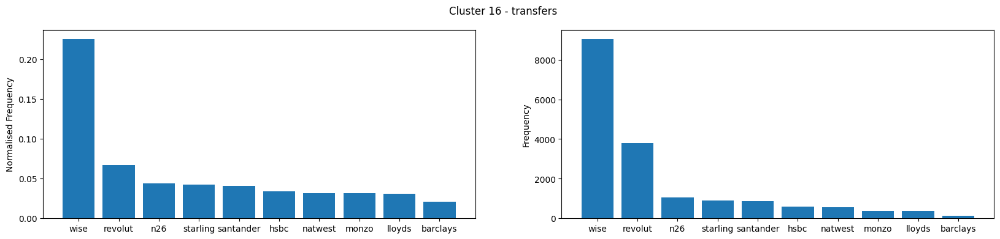

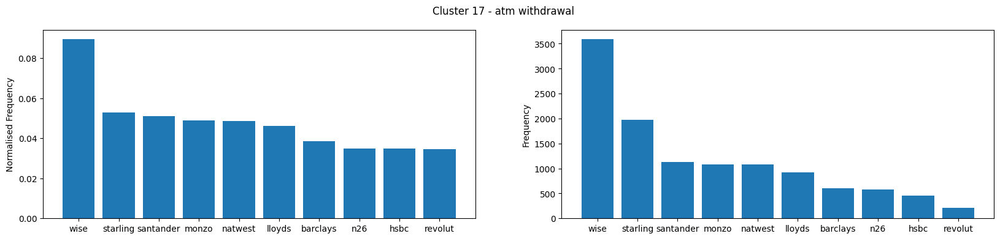

In [ ]:
# defining a function to get the size for each label for a given bank
def label_size_bank(cluster_number):
    
    # getting normalised cluster size for each class for all clusters
    norm_cluster_pred = []
    cluster_pred = []
    for bank in bank_names:
        count_cluster_number = sum(sentence_embeddings_large_df.loc[sentence_embeddings_large_df.loc[:, "company"] == bank, f"label_{cluster_number}"])
        norm_count_cluster_number = len(sentence_embeddings_large_df.loc[sentence_embeddings_large_df.loc[:, "company"] == bank])
        norm_cluster_pred.append((bank, count_cluster_number/norm_count_cluster_number))
        cluster_pred.append((bank, count_cluster_number))
    
    # sorting by size of label
    norm_cluster_pred_sorted = sorted(norm_cluster_pred, key=lambda x: x[1], reverse=True)
    cluster_pred_sorted = sorted(cluster_pred, key=lambda x: x[1], reverse=True)
    
    # sorting banks in order of frequency of a given label
    bank_names_sorted = [cluster_tuple[0] for cluster_tuple in norm_cluster_pred_sorted]
    
    # sorting normalised frequencies
    norm_bank_cluster_size_sorted = [cluster_tuple[1] for cluster_tuple in norm_cluster_pred_sorted]
    
    # sorting raw frequencies
    bank_cluster_size_sorted = [cluster_tuple[1] for cluster_tuple in cluster_pred_sorted]
    
    return norm_bank_cluster_size_sorted, bank_cluster_size_sorted, bank_names_sorted


# defining a function to get the cluster size for each bank for a given cluster
def eda_label_freq(cluster_number):
    
    norm_bank_cluster_size_sorted, bank_cluster_size_sorted, bank_names_sorted = label_size_bank(cluster_number)
    
    # plotting raw and normalised distribution
    fig, axs = plt.subplots(1, 2, figsize=(20, 4))
    plt.suptitle(f"Cluster {cluster_number} - {topic_dict[cluster_number]}")
    axs[0].bar(bank_names_sorted, norm_bank_cluster_size_sorted)
    axs[0].set_ylabel("Normalised Frequency")
    axs[1].bar(bank_names_sorted, bank_cluster_size_sorted)
    axs[1].set_ylabel("Frequency")
    plt.show()

# iterating over each cluster
for cluster_number in cluster_numbers:
    eda_label_freq(cluster_number)

## Distribution of Bank Labels Over Time - Internal Performance

In [ ]:
# getting yy_mm date from date column
sentence_embeddings_large_df["yy_mm_date"] = sentence_embeddings_large_df["date"].apply(lambda x: x[:-3])
sentence_embeddings_large_df_sorted = sentence_embeddings_large_df.sort_values(by=['yy_mm_date'], ascending=False)

# getting earliest and latest review year
def start_end_date_bank(bank):
    start_year = sentence_embeddings_large_df_sorted.loc[sentence_embeddings_large_df_sorted.loc[:, "company"] == bank, "yy_mm_date"].iloc[-1].split("-")[0]
    end_year = sentence_embeddings_large_df_sorted.loc[sentence_embeddings_large_df_sorted.loc[:, "company"] == bank, "yy_mm_date"].iloc[0].split("-")[0]
    
    return start_year, end_year

# getting dates to plot on
def get_dates_bank(bank):

    start_year, end_year = start_end_date_bank(bank)
    start_year = int(start_year)
    end_year = int(end_year)

    # getting x axis (YY-MM date)
    dates = []
    for year in range(start_year, end_year + 1):
        for month in range(1, 13):
            if year == 2022 and month == 7:
                break
            else:
                if month < 10:
                    dates.append("{0}-0{1}".format(year, month))
                else:
                    dates.append("{0}-{1}".format(year, month))
    
    return dates

# getting time series of counts of labels at each month and year for each bank
def time_series_bank(bank):
    
    dates = get_dates_bank(bank)
    bank_time_series = []
    
    # iterating over each label for a given bank and counting number of sentences labelled as label "cluster_number"
    for cluster_number in cluster_numbers:
        bank_df = sentence_embeddings_large_df.loc[sentence_embeddings_large_df.loc[:, "company"] == bank, :]
        cluster_time_series = []
        for date in dates:
            count_label = sum(bank_df.loc[bank_df.loc[:, "yy_mm_date"] == date, f"label_{cluster_number}"])
            cluster_time_series.append(count_label)
        bank_time_series.append(cluster_time_series)
    
    return bank_time_series


# setting up figure and lists to store buttons
fig = go.Figure()
buttons_1 = []
y_buttons_1 = -0.15

counter = 0 # counter to set visible plot

# iterating over each bank and each label, plotting line trace and formatting the button
for bank in bank_names:
    
    dates = get_dates_bank(bank)
    bank_time_series = time_series_bank(bank)
    
    counter += 1
    
    for cluster_number in cluster_numbers:
        
        topic = topic_dict[cluster_number]
        
        # plotting distribution of clusters
        fig.add_trace(go.Scatter(
            x=dates, 
            y=bank_time_series[cluster_number], 
            visible=True if counter == 1 else False,
            name=topic_dict[cluster_number],
            hovertemplate='<b>%{text}</b><extra></extra>',
            text=[topic for i in range(len(bank_time_series[cluster_number]))], 
            mode='lines'))
    
    # button formatting
    button =  dict(
        args = [{'x': [dates], 'visible':[True if bank_name == bank else False for bank_name in bank_names for cluster_number in cluster_numbers]}, 
                {"title": f"Frequency Distribution of {bank.title()} Labels Over Time"}], 
        label = bank.title(),
        method = 'update'
    )

    buttons_1.append(button)

# Add dropdown
fig.update_layout(
    updatemenus=[
        dict(
            type = "buttons",
            direction="right",
            buttons=buttons_1,
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0,
            xanchor="left",
            y=y_buttons_1,
            yanchor="top"
        )
    ]
)

fig.update_layout(height=700, width=1500,
                  legend=dict(font=dict(size= 15)),
    title={
        'text': f"Frequency Distribution of {bank_names[0].title()} Labels Over Time",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis_title="Frequency",
    showlegend=True)

fig.show()

## Normalised Distribution of Labels Over Time by Bank - Benchmarking

In [ ]:
# getting earliest and latest review year
def start_end_date_cluster(cluster_number):
    
    start_year = sentence_embeddings_large_df_sorted.loc[sentence_embeddings_large_df_sorted.loc[:, f"label_{cluster_number}"] == 1, "yy_mm_date"].iloc[-1].split("-")[0]
    end_year = sentence_embeddings_large_df_sorted.loc[sentence_embeddings_large_df_sorted.loc[:, f"label_{cluster_number}"] == 1, "yy_mm_date"].iloc[0].split("-")[0]
    
    return start_year, end_year

# getting dates to plot on
def get_dates_cluster(cluster_number):

    start_year, end_year = start_end_date_cluster(cluster_number)
    start_year = int(start_year)
    end_year = int(end_year)

    # getting x axis (YY-MM date) - dates between start and end year
    dates = []
    for year in range(start_year, end_year + 1):
        for month in range(1, 13):
            if year == 2022 and month == 7:
                break
            else:
                if month < 10:
                    dates.append("{0}-0{1}".format(year, month))
                else:
                    dates.append("{0}-{1}".format(year, month))
    
    return dates

# getting time series of normalised counts of labels at each month and year
def norm_time_series_cluster(cluster_number):
    
    dates = get_dates_cluster(cluster_number)
    cluster_time_series = []
    
    # iterating over each bank and date, and counting number of sentences labelled as label "cluster_number"
    for bank in bank_names:
        bank_df = sentence_embeddings_large_df.loc[sentence_embeddings_large_df.loc[:, "company"] == bank, :]
        bank_time_series = []
        for date in dates:
            count_label = sum(bank_df.loc[bank_df.loc[:, "yy_mm_date"] == date, f"label_{cluster_number}"])
            bank_time_series.append(count_label/len(bank_df))
        cluster_time_series.append(bank_time_series)
    
    return cluster_time_series

# setting up figure and lists to store buttons
fig = go.Figure()
buttons_1 = []
y_buttons_1 = -0.15

counter = 0 # counter to set visible plot

# iterating over each cluster number and each bank, plotting line trace and formatting the button
for cluster_number in cluster_numbers:
    
    dates = get_dates_cluster(cluster_number)
    cluster_time_series = norm_time_series_cluster(cluster_number)
    topic = topic_dict[cluster_number]
    
    counter += 1
    
    for i in range(len(bank_names)):
        
        bank = bank_names[i]
        
        # plotting distribution of clusters
        fig.add_trace(go.Scatter(
            x=dates, 
            y=cluster_time_series[i], 
            visible=True if counter == 1 else False,
            name=bank,
            hovertemplate='<b>%{text}</b><extra></extra>',
            text=[bank for j in range(len(cluster_time_series[i]))], 
            mode='lines'))
    
    # button formatting
    button =  dict(
        args = [{'visible':[True if cluster_no == cluster_number else False for cluster_no in cluster_numbers for bank_name in bank_names]}, 
                {"title": f"Normalised Frequency Distribution of {topic_dict[cluster_number].title()} by Bank Over Time"}], 
        label = cluster_number,
        method = 'update'
    )

    buttons_1.append(button)

# Add dropdown
fig.update_layout(
    updatemenus=[
        dict(
            type = "buttons",
            direction="right",
            buttons=buttons_1,
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0,
            xanchor="left",
            y=y_buttons_1,
            yanchor="top"
        )
    ]
)

fig.update_layout(height=700, width=1500,
                  legend=dict(font=dict(size= 15)),
    title={
        'text': f"Normalised Frequency Distribution of {topic_dict[0].title()} by Bank Over Time",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis_title="Normalised Frequency",
    showlegend=True)

fig.show()

## Cumulative Normalised Distribution of Labels Over Time by Bank - Benchmarking

In [ ]:
# getting time series of cumulative normalised counts of labels at each month and year
def cum_time_series_cluster(cluster_number):
    
    dates = get_dates_cluster(cluster_number)
    cluster_time_series = []
    
    # iterating over each bank and date, and counting number of sentences labelled as label "cluster_number"
    for bank in bank_names:
        bank_df = sentence_embeddings_large_df.loc[sentence_embeddings_large_df.loc[:, "company"] == bank, :]
        bank_cluster_df = bank_df.loc[bank_df.loc[:, f"label_{cluster_number}"] == 1]
        bank_time_series = []
        cum_sum = 0
        for date in dates:
            count_label = sum(bank_df.loc[bank_df.loc[:, "yy_mm_date"] == date, f"label_{cluster_number}"])
            cum_sum += count_label/len(bank_cluster_df)
            bank_time_series.append(cum_sum)
        cluster_time_series.append(bank_time_series)
    
    return cluster_time_series

# setting up figure and lists to store buttons
fig = go.Figure()
buttons_1 = []
y_buttons_1 = -0.15

counter = 0 # counter to set visible plot

# iterating over each cluster number and each bank, plotting line trace and formatting the button
for cluster_number in cluster_numbers:
    
    dates = get_dates_cluster(cluster_number)
    cluster_time_series = cum_time_series_cluster(cluster_number)
    topic = topic_dict[cluster_number]
    
    counter += 1
    
    for i in range(len(bank_names)):
        
        bank = bank_names[i]
        
        # plotting distribution of clusters
        fig.add_trace(go.Scatter(
            x=dates, 
            y=cluster_time_series[i], 
            visible=True if counter == 1 else False,
            name=bank,
            hovertemplate='<b>%{text}</b><extra></extra>',
            text=[bank for j in range(len(cluster_time_series[i]))], 
            mode='lines'))
    
    # button formatting
    button =  dict(
        args = [{'visible':[True if cluster_no == cluster_number else False for cluster_no in cluster_numbers for bank_name in bank_names]}, 
                {"title": f"Cumulative Normalised Frequency Distribution of {topic_dict[cluster_number].title()} by Bank Over Time"}], 
        label = cluster_number,
        method = 'update'
    )

    buttons_1.append(button)

# Add dropdown
fig.update_layout(
    updatemenus=[
        dict(
            type = "buttons",
            direction="right",
            buttons=buttons_1,
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0,
            xanchor="left",
            y=y_buttons_1,
            yanchor="top"
        )
    ]
)

fig.update_layout(height=700, width=1500,
                  legend=dict(font=dict(size= 15)),
    title={
        'text': f"Cumulative Normalised Frequency Distribution of {topic_dict[0].title()} by Bank Over Time",
        'y':0.9,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis_title="Cumulative Normalised Frequency",
    showlegend=True)

fig.show()

# Moving Average Plots

In [ ]:
# getting earliest and latest review year
def start_month_index_bank(bank):
    dates = get_dates_bank(bank)
    start_yy_mm = sentence_embeddings_large_df_sorted.loc[sentence_embeddings_large_df_sorted.loc[:, "company"] == bank, "yy_mm_date"].iloc[-1]
    start_index = dates.index(start_yy_mm)
    
    return start_index

def ma_time_series_bank(bank, n_month_ma):
    
    dates = get_dates_bank(bank)
    start_index = start_month_index_bank(bank)
    bank_time_series = time_series_bank(bank)
    cluster_ma = []
    
    for cluster_number in cluster_numbers:
        cluster_time_series = bank_time_series[cluster_number]
        avg_cluster_size_ma = []
        for i in range(len(dates)):
            if i >= start_index + n_month_ma - 1:
                cluster_size_sum = 0
                for j in range(n_month_ma):
                    cluster_size_sum += cluster_time_series[i - j]
                avg_cluster_size_ma.append(cluster_size_sum/n_month_ma)
            else:
                avg_cluster_size_ma.append(0)
        cluster_ma.append(avg_cluster_size_ma)
    
    return cluster_ma

# iterating over 3 sets of moving averages
n_month_avg = [3, 6, 12]
# n_month_avg = [3]
for n_month_ma in n_month_avg:
    
    # setting up figure and lists to store buttons
    fig = go.Figure()
    buttons_1 = []
    y_buttons_1 = -0.15

    counter = 0 # counter to set visible plot

    # iterating over each bank and each label, plotting line trace and formatting the button
    for bank in bank_names:

        dates = get_dates_bank(bank)
        bank_time_series = ma_time_series_bank(bank, n_month_ma)

        counter += 1

        for cluster_number in cluster_numbers:

            topic = topic_dict[cluster_number]

            # plotting distribution of clusters
            fig.add_trace(go.Scatter(
                x=dates, 
                y=bank_time_series[cluster_number], 
                visible=True if counter == 1 else False,
                name=topic_dict[cluster_number],
                hovertemplate='<b>%{text}</b><extra></extra>',
                text=[topic for i in range(len(bank_time_series[cluster_number]))], 
                mode='lines'))

        # button formatting
        button =  dict(
            args = [{'x': [dates], 'visible':[True if bank_name == bank else False for bank_name in bank_names for cluster_number in cluster_numbers]},
                    {"title": f"{n_month_ma}-month MA of {bank.title()} Labels Over Time"}], 
            label = bank.title(),
            method = 'update'
        )

        buttons_1.append(button)

    # Add dropdown
    fig.update_layout(
        updatemenus=[
            dict(
                type = "buttons",
                direction="right",
                buttons=buttons_1,
                pad={"r": 10, "t": 10},
                showactive=True,
                x=0,
                xanchor="left",
                y=y_buttons_1,
                yanchor="top"
            )
        ]
    )

    fig.update_layout(
        title={
            'text': f"{n_month_ma}-month MA of {bank_names[0].title()} Labels Over Time",
            'y':0.9,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'},
        yaxis_title="Frequency",
        showlegend=True)
    
    fig.show()

# Evaluating Tagging of Noise from Training and Validation 

In [ ]:
# getting predictions over training and validation set
train_validation_df = loading_file('data/processed/model_development/training_validation/', f'training_validation_df_iteration_{iteration_number}.csv', 1)
train_validation_df_noise = train_validation_df.loc[train_validation_df.loc[:, "grouped_cluster"] == -1, :]

# declaring column names and word embeddings
x_col_name = [str(i) for i in range(512)]
x_features = train_validation_df_noise.loc[:, x_col_name]

cluster_numbers = [cluster_number for cluster_number in topic_dict.keys()]

# iterating over each cluster number
for cluster_number in cluster_numbers:
    
    pred_list = []
    prob_list = []
    for iteration in range(1, 11): # iterating over each rf iteration
        
        # loading random forest, getting prediction and appending results onto list
        rf = loading_model(model_filepath, f'1000_n_estimators_25_max_features_100_max_depth_cluster_{cluster_number}_rf_{iteration}.sav')
        pred_cluster = rf.predict(x_features).astype(int)
        pred_list.append(pred_cluster)
        
        prob_list.append(rf.predict_proba(x_features)[:, 1])
    
    # majority voting
    pred_array = np.array(pred_list) # resulting array shape: 10 (number of model iterations) x number of sentences
    pred_array_transpose = np.transpose(pred_array) # resulting array shape: number of sentences x 10 (number of model iterations)
    majority_voting_pred = [Counter(pred_array_transpose[i]).most_common(1)[0][0] for i in range(len(train_validation_df_noise))] # getting most commonly voted prediction
    train_validation_df_noise[f'label_{cluster_number}'] = majority_voting_pred # assigning classification to column
    
    # averaging probabilities
    prob_array = np.array(prob_list) # resulting array shape: 10 (number of model iterations) x number of sentences
    prob_array_transpose = np.transpose(prob_array) # resulting array shape: number of sentences x 10 (number of model iterations)
    averaging_prob = [mean(prob_array_transpose[i]) for i in range(len(train_validation_df_noise))] # averaging classification probability 
    train_validation_df_noise[f'label_{cluster_number}_prob'] = averaging_prob # assigning probability to column
    
saving_file(train_validation_df_noise, results_filepath, 'ovr_noise_multitagging.csv')

train_validation_df_noise

<ipython-input-31-85f5282c688b>:27: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-31-85f5282c688b>:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-31-85f5282c688b>:27: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-31-85f5

<ipython-input-31-85f5282c688b>:27: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-31-85f5282c688b>:33: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-31-85f5282c688b>:27: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-31-85f5

,0,1,2,3,4,5,6,7,8,9,...,label_13,label_13_prob,label_14,label_14_prob,label_15,label_15_prob,label_16,label_16_prob,label_17,label_17_prob
0,0.022525,0.007869,0.010335,0.037055,-0.030765,-0.032453,0.071550,0.012691,-0.057802,0.058597,...,0,0.3594,0,0.1364,0,0.2197,0,0.1587,0,0.2177
1,-0.063833,0.010167,-0.078405,-0.086223,0.034190,-0.020247,-0.029329,0.017152,0.021778,-0.027430,...,0,0.2925,0,0.1782,0,0.1945,0,0.1832,0,0.1924
2,0.032218,-0.010275,0.070152,-0.034202,0.006700,-0.022971,-0.011071,0.080753,0.047997,0.035239,...,0,0.4338,0,0.2474,0,0.1941,0,0.2028,0,0.2121
4,0.011127,-0.015296,-0.039420,-0.004885,0.051390,0.003740,0.012794,0.025916,0.035444,0.027159,...,0,0.2667,0,0.2255,0,0.4423,0,0.1687,0,0.1810
6,0.016328,-0.022159,-0.011614,-0.051973,0.124922,-0.038697,0.012216,0.048161,0.056954,0.019773,...,1,0.5569,0,0.2298,0,0.2230,0,0.2178,0,0.3237
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
51239,0.065232,-0.017679,0.037399,0.023218,0.009773,-0.075989,0.018545,0.042617,-0.039081,-0.064625,...,0,0.3178,0,0.1908,0,0.2113,0,0.1543,0,0.1741
51241,0.010469,0.071850,0.004952,-0.039925,-0.045942,-0.054893,0.029725,0.051819,0.009769,0.047804,...,0,0.2874,0,0.0972,0,0.1643,0,0.1004,0,0.1514
51243,0.054783,-0.056506,-0.015711,0.063274,0.006796,-0.046879,0.052663,0.048120,-0.035402,-0.024210,...,0,0.2205,0,0.1667,0,0.2260,0,0.1695,0,0.2363
51246,-0.008454,-0.037280,0.035448,0.034990,-0.011482,0.061854,0.065429,-0.016928,-0.009474,-0.008778,...,0,0.2975,0,0.2717,0,0.1976,0,0.1871,0,0.2951


<ipython-input-34-a48bd6924215>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-34-a48bd6924215>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-34-a48bd6924215>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-34-a48bd69

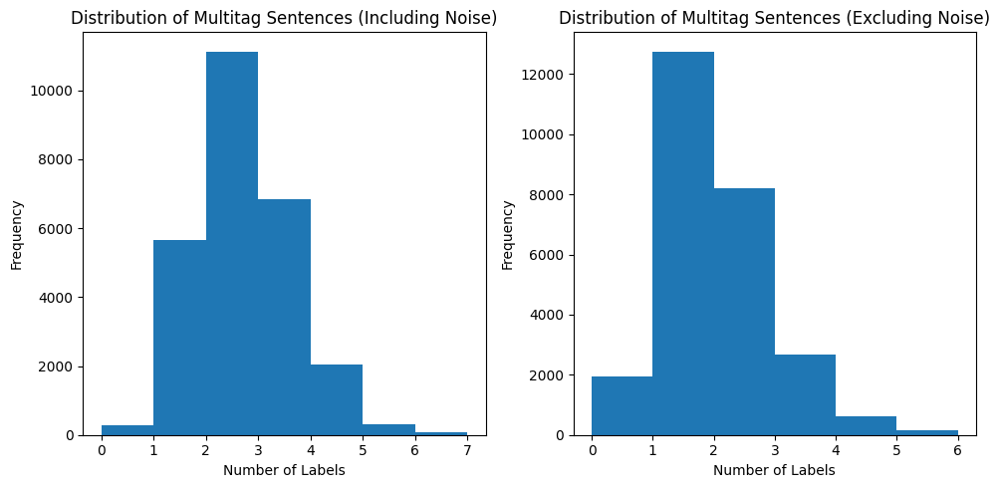

In [ ]:
# getting number of tags for each sentence
train_validation_df_noise["multi_class"] = 0
train_validation_df_noise["multi_class_nn"] = 0
for cluster_number in cluster_numbers:
    train_validation_df_noise["multi_class"] += train_validation_df_noise[f"label_{cluster_number}"]
    if cluster_number != -1:
        train_validation_df_noise["multi_class_nn"] += train_validation_df_noise[f"label_{cluster_number}"]

num_labels = [label for label in train_validation_df_noise.loc[:, "multi_class"]]
num_labels_nn = [label for label in train_validation_df_noise.loc[:, "multi_class_nn"]]

# plotting raw and normalised distribution
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
# plt.suptitle(f"Cluster {cluster_number} - {topic_dict[cluster_number]}")
axs[0].hist(num_labels, bins=max(num_labels))
axs[0].set_ylabel("Frequency")
axs[0].set_xlabel("Number of Labels")
axs[0].set_title("Distribution of Multitag Sentences (Including Noise)")

axs[1].hist(num_labels_nn, bins=max(num_labels_nn))
axs[1].set_ylabel("Frequency")
axs[1].set_xlabel("Number of Labels")
axs[1].set_title("Distribution of Multitag Sentences (Excluding Noise)")

plt.tight_layout()
plt.show()

In [ ]:
capped_multitag = 3

# capping number of labels to 3
train_validation_df_noise["capped_multi_class"] = train_validation_df_noise["multi_class"].apply(lambda x: x if x <= capped_multitag else capped_multitag)

# concatenating label combinations into a string
train_validation_df_noise["multitag_combination"] = ""
for cluster_number in cluster_numbers:
    train_validation_df_noise["multitag_combination"] += train_validation_df_noise[f"label_{cluster_number}"].astype(str)

# unpacking string of label combinations into a list
train_validation_df_noise["multi_tag_array"] = train_validation_df_noise["multitag_combination"].apply(lambda x: [*x])

# merging classification probability to a single string
train_validation_df_noise["multitag_combination_prob"] = ""
counter = 0
for cluster_number in cluster_numbers:
    counter += 1
    if counter != len(cluster_numbers):
        train_validation_df_noise["multitag_combination_prob"] += train_validation_df_noise[f"label_{cluster_number}_prob"].astype(str) + ","
    else:
        train_validation_df_noise["multitag_combination_prob"] += train_validation_df_noise[f"label_{cluster_number}_prob"].astype(str)

# converting string of probabilities to list of probabilities
train_validation_df_noise["multi_tag_prob_array"] = train_validation_df_noise["multitag_combination_prob"].apply(lambda x: list(map(float, x.split(","))))

# merging list of labels and probabilities into a single list
train_validation_df_noise['multi_tag_label_prob'] = list(zip(train_validation_df_noise.multi_tag_array, train_validation_df_noise.multi_tag_prob_array))

# unpacking both lists to form a list of tuples consisting of the tag (0 or 1), probability and label
train_validation_df_noise["tag_prob_label"] = train_validation_df_noise["multi_tag_label_prob"].apply(lambda x: [(x[0][i], x[1][i], i-1) for i in range(len(x[0]))])

# sorting tuples by the probability in descending order
train_validation_df_noise["tag_prob_label_sorted"] = train_validation_df_noise["tag_prob_label"].apply(lambda x: sorted(x, key=lambda y: y[1], reverse=True))

# merging list of tuples with number of labels/classes 
train_validation_df_noise["tag_prob_label_sorted_multi_class"] = list(zip(train_validation_df_noise.tag_prob_label_sorted, train_validation_df_noise.capped_multi_class))

# getting the multiple labels the sentences are tagged as 
train_validation_df_noise["top_tag_prob_labels"] = train_validation_df_noise["tag_prob_label_sorted_multi_class"].apply(lambda x: x[0][: x[1]])

# topics of each label, stored as an array
train_validation_df_noise["top_topics_list"] = train_validation_df_noise["top_tag_prob_labels"].apply(lambda x: sorted([topic_dict[tag_prob_label[2]] for tag_prob_label in x]))

# topics of each label as string
train_validation_df_noise["top_topics_str"] = train_validation_df_noise["top_topics_list"].apply(lambda x: ", ".join(x))

num_top_plot = 20
num_multitags = [i for i in range(1, capped_multitag+1)]
for num in num_multitags:
    
    num_multitag_df = train_validation_df_noise.loc[train_validation_df_noise.loc[:, 'capped_multi_class'] == num, :]
    multitag_combinations = list(set(num_multitag_df.loc[:, 'top_topics_str']))
    combi_count_tuples = [(combi, len(num_multitag_df.loc[num_multitag_df.loc[:, "top_topics_str"] == combi, :])) for combi in multitag_combinations]
    combi_count_tuples_sorted = sorted(combi_count_tuples, key=lambda x: x[1], reverse=True)[:num_top_plot + 1]
    combi_count_tuples_sorted = sorted(combi_count_tuples_sorted, key=lambda x: x[1])
    combi_counts = [combi_tuple[1] for combi_tuple in combi_count_tuples_sorted]
    combi_topics = [combi_tuple[0] for combi_tuple in combi_count_tuples_sorted]
    
    combi_norm_count_tuples = [(combi, len(num_multitag_df.loc[num_multitag_df.loc[:, "top_topics_str"] == combi, :])/len(num_multitag_df)) for combi in multitag_combinations]
    combi_norm_count_tuples_sorted = sorted(combi_norm_count_tuples, key=lambda x: x[1], reverse=True)[:num_top_plot + 1]
    combi_norm_count_tuples_sorted = sorted(combi_norm_count_tuples_sorted, key=lambda x: x[1])
    combi_norm_counts = [combi_tuple[1] for combi_tuple in combi_norm_count_tuples_sorted]
    combi_norm_topics = [combi_tuple[0] for combi_tuple in combi_norm_count_tuples_sorted]
    
    # setting up figure and lists to store buttons
    fig = go.Figure()
    buttons_1 = []
    y_buttons_1 = -0.15
    
    # plotting distribution of clusters
    fig.add_trace(go.Bar(
        x=combi_counts, 
        y=combi_topics,
        visible=True,
        orientation='h'))
    
    # button formatting
    button =  dict(
        args = [{'visible':[True, False]}, 
                {"title": f"Distribution of Unique Label Combinations with {num} labels (Only Noise)", "xaxis_title": "Frequency"}], 
        label = "Raw Frequency",
        method = 'update'
    )            
    buttons_1.append(button)
    
    # plotting normalised distribution of clusters
    fig.add_trace(go.Bar(
        x=combi_norm_counts, 
        y=combi_norm_topics,
        visible=False,
        orientation='h'))
    
    # button formatting
    button =  dict(
        args = [{'visible':[False, True]}, 
                {"title": f"Normalised Distribution of Unique Label Combinations with {num} labels (Only Noise)", "xaxis_title": "Normalised Frequency"}], 
        label = "Normalised Frequency",
        method = 'update'
    )
    buttons_1.append(button)

                 
    # Add dropdown
    fig.update_layout(
        updatemenus=[
            dict(
                type = "buttons",
                direction="right",
                buttons=buttons_1,
                pad={"r": 10, "t": 10},
                showactive=True,
                x=0,
                xanchor="left",
                y=y_buttons_1,
                yanchor="top"
            )
        ]
    )

    fig.update_layout(
        title={
            'text': f"Distribution of Unique Label Combinations with {num} labels (Only Noise)",
            'y':0.9,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'},
        xaxis_title="Frequency",
        yaxis = dict(tickfont = dict(size=10)),
        xaxis = dict(tickfont = dict(size=10)),
        showlegend=False)

    fig.show()
    
    print(f"Total number of unique label combinations with {num} labels: {len(multitag_combinations)}")


Total number of unique label combinations with 1 labels: 19


Total number of unique label combinations with 2 labels: 144


Total number of unique label combinations with 3 labels: 445


In [ ]:
cluster_numbers = cluster_numbers[1:]

# unpacking string of label combinations into a list
train_validation_df_noise["multi_tag_array"] = train_validation_df_noise["multitag_combination"].apply(lambda x: [*x][1:])

# merging classification probability to a single string
train_validation_df_noise["multitag_combination_prob"] = ""
counter = 0
for cluster_number in cluster_numbers:
    counter += 1
    if counter != len(cluster_numbers):
        train_validation_df_noise["multitag_combination_prob"] += train_validation_df_noise[f"label_{cluster_number}_prob"].astype(str) + ","
    else:
        train_validation_df_noise["multitag_combination_prob"] += train_validation_df_noise[f"label_{cluster_number}_prob"].astype(str)

# converting string of probabilities to list of probabilities
train_validation_df_noise["multi_tag_prob_array"] = train_validation_df_noise["multitag_combination_prob"].apply(lambda x: list(map(float, x.split(","))))

# merging list of labels and probabilities into a single list
train_validation_df_noise['multi_tag_label_prob'] = list(zip(train_validation_df_noise.multi_tag_array, train_validation_df_noise.multi_tag_prob_array))

# unpacking both lists to form a list of tuples consisting of the tag (0 or 1), probability and label
train_validation_df_noise["tag_prob_label"] = train_validation_df_noise["multi_tag_label_prob"].apply(lambda x: [(x[0][i], x[1][i], i) for i in range(len(x[0]))])

# sorting tuples by the probability in descending order
train_validation_df_noise["tag_prob_label_sorted"] = train_validation_df_noise["tag_prob_label"].apply(lambda x: sorted(x, key=lambda y: y[1], reverse=True))

# merging list of tuples with number of labels/classes 
train_validation_df_noise["tag_prob_label_sorted_multi_class"] = list(zip(train_validation_df_noise.tag_prob_label_sorted, train_validation_df_noise.capped_multi_class))

# getting the multiple labels the sentences are tagged as 
train_validation_df_noise["top_tag_prob_labels"] = train_validation_df_noise["tag_prob_label_sorted_multi_class"].apply(lambda x: x[0][: x[1]])

# topics of each label, stored as an array
train_validation_df_noise["top_topics_list"] = train_validation_df_noise["top_tag_prob_labels"].apply(lambda x: sorted([topic_dict[tag_prob_label[2]] for tag_prob_label in x]))

# topics of each label as string
train_validation_df_noise["top_topics_str"] = train_validation_df_noise["top_topics_list"].apply(lambda x: ", ".join(x))

num_top_plot = 20
num_multitags = [i for i in range(1, capped_multitag+1)]
for num in num_multitags:
    
    num_multitag_df = train_validation_df_noise.loc[train_validation_df_noise.loc[:, 'capped_multi_class'] == num, :]
    multitag_combinations = list(set(num_multitag_df.loc[:, 'top_topics_str']))
    combi_count_tuples = [(combi, len(num_multitag_df.loc[num_multitag_df.loc[:, "top_topics_str"] == combi, :])) for combi in multitag_combinations]
    combi_count_tuples_sorted = sorted(combi_count_tuples, key=lambda x: x[1], reverse=True)[:num_top_plot + 1]
    combi_count_tuples_sorted = sorted(combi_count_tuples_sorted, key=lambda x: x[1])
    combi_counts = [combi_tuple[1] for combi_tuple in combi_count_tuples_sorted]
    combi_topics = [combi_tuple[0] for combi_tuple in combi_count_tuples_sorted]
    
    combi_norm_count_tuples = [(combi, len(num_multitag_df.loc[num_multitag_df.loc[:, "top_topics_str"] == combi, :])/len(num_multitag_df)) for combi in multitag_combinations]
    combi_norm_count_tuples_sorted = sorted(combi_norm_count_tuples, key=lambda x: x[1], reverse=True)[:num_top_plot + 1]
    combi_norm_count_tuples_sorted = sorted(combi_norm_count_tuples_sorted, key=lambda x: x[1])
    combi_norm_counts = [combi_tuple[1] for combi_tuple in combi_norm_count_tuples_sorted]
    combi_norm_topics = [combi_tuple[0] for combi_tuple in combi_norm_count_tuples_sorted]
    
    # setting up figure and lists to store buttons
    fig = go.Figure()
    buttons_1 = []
    y_buttons_1 = -0.15
    
    # plotting distribution of clusters
    fig.add_trace(go.Bar(
        x=combi_counts, 
        y=combi_topics,
        visible=True,
        orientation='h'))
    
    # button formatting
    button =  dict(
        args = [{'visible':[True, False]}, 
                {"title": f"Distribution of Unique Label Combinations with {num} labels (Excluding Noise)", "xaxis_title": "Frequency"}], 
        label = "Raw Frequency",
        method = 'update'
    )            
    buttons_1.append(button)
    
    # plotting normalised distribution of clusters
    fig.add_trace(go.Bar(
        x=combi_norm_counts, 
        y=combi_norm_topics,
        visible=False,
        orientation='h'))
    
    # button formatting
    button =  dict(
        args = [{'visible':[False, True]}, 
                {"title": f"Normalised Distribution of Unique Label Combinations with {num} labels (Excluding Noise)", "xaxis_title": "Normalised Frequency"}], 
        label = "Normalised Frequency",
        method = 'update'
    )
    buttons_1.append(button)

                 
    # Add dropdown
    fig.update_layout(
        updatemenus=[
            dict(
                type = "buttons",
                direction="right",
                buttons=buttons_1,
                pad={"r": 10, "t": 10},
                showactive=True,
                x=0,
                xanchor="left",
                y=y_buttons_1,
                yanchor="top"
            )
        ]
    )

    fig.update_layout(
        title={
            'text': f"Distribution of Unique Label Combinations with {num} labels (Excluding Noise)",
            'y':0.9,
            'x':0.5,
            'xanchor': 'center',
            'yanchor': 'top'},
        xaxis_title="Frequency",
        yaxis = dict(tickfont = dict(size=10)),
        xaxis = dict(tickfont = dict(size=10)),
        showlegend=False)

    fig.show()
    
    print(f"Total number of unique label combinations with {num} labels: {len(multitag_combinations)}")


Total number of unique label combinations with 1 labels: 18


Total number of unique label combinations with 2 labels: 137


Total number of unique label combinations with 3 labels: 431
